<a href="https://colab.research.google.com/github/nargonne/Galaxy-Morphology-Classification/blob/main/Version_8_Galaxy_Morphology_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Galaxy Zoo Morphology Classification (V8)

* **Baseline:** CNN Model-3
* **Data:** Galaxy Zoo 2 from Kaggle, high-confidence filter
* **Image Pre-processing:**
  - `crop_resize.sh` -- center crop resize to 224x224
  - `augment_images.sh` -- rotations, negatives, flips
  - `bw_boosted_images.sh` -- grayscale, auto-levels
* **Dataset Size**:
  - ellipticals: 11004
  - spirals: 6491
  - barred-spirals: 9001
* **Notes:**
  - Barred-spiral augmented with `augment_images.sh` to bump the numbers up from 1500 to about 9000
  - Randomly removed about 15,000 images from ellipticals to get the number down to around 11000
<br />

---

This project aims to train a convolutional neural network (CNN) to classify galaxy images. To achieve this, a dataset was obtained from [Kaggle](https://www.kaggle.com/datasets/robertmifsud/resized-reduced-gz2-images), which is a curated version of the Galaxy Zoo 2 images originally found on [Zenodo](https://zenodo.org/record/3565489). The dataset is divided into three folders, each named according to the image category, and these names serve as the training labels. The image classifications are:

-  Elliptical
-  Spiral
-  Barred-Spiral

The Galaxy Zoo project achieved the dataset labeling, where thousands of volunteers manually examined and categorized galaxy images. The survey results were then analyzed to create a debiased labeling, described by [Ross E. Hart et al.](https://doi.org/10.1093/mnras/stw1588)

The CNN model is trained using this labeled dataset to learn patterns and features that can distinguish between different types of galaxies. Subsequently, the model's performance is evaluated on validation and test datasets to assess its ability to classify unseen galaxy images accurately.

## Setup Workspace

1. Import libraries and such
1. Create the directories and path variables used in this notebook
1. Copy over the source data files and unpack them

In [9]:
# Import standard and visualization libraries
%matplotlib inline
import os
import shutil
import datetime
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython import display  # Display local file img in code cell

# Math and Array Manipulation
from math import ceil            # For rounding numbers to nearest int
from numpy import expand_dims    # Used in the Featuremaps block

# Import libraries for working with files and data manipulation
import tarfile, zipfile
import cv2
from pathlib import Path       # For file paths
from PIL import Image          # Working with images like opening them
from tqdm.notebook import tqdm # A neat little progress bar

# Google Colab specific libraries
from google.colab import drive  # Need this to mount your Google drive
from google.colab import files  # Working with colab directories
from shutil import copy         # Need this for copying files

# Import libraries for model evaluation
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.utils import class_weight  # Try to balance the training classes

# Import TensorFlow and Keras libraries
import tensorflow as tf
from tensorflow.keras import Input
from tensorflow.keras.backend import clear_session
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.initializers import he_uniform
from tensorflow.keras.optimizers import Adam, RMSprop, SGD, Adadelta
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler, TensorBoard
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import VGG16, EfficientNetB0

# Load specific Jupyter and Colab extensions
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [2]:
# Check to see what runtime you are using
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

# Check memory usage
from psutil import virtual_memory

ram_gb = virtual_memory().total / 1e9
print('\nYour runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Sat Aug 26 19:01:02 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8    12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
# Clear any logs from previous runs
!rm -rf /tmp/logs/*

### Data Source Location

The galaxy images are stored in Google Drive and the following code mounts the drive here in Colab.


In [4]:
# Mount Google Drive
if os.path.isdir('/content/gdrive') != True:
  drive.mount('/content/gdrive')
else:
  print(f"Google Drive is already mounted.")

Mounted at /content/gdrive


### Create Local Folders

We need to create some folders in Colab to work with. The code below is a function used to create folders. Afther that is a code block where the function is called to make the necessary folders.

In [5]:
# Function to create a directory
def make_dir(path):
  """
  A simple function check if a directory already
  exists and create one as needed.
  """
  if os.path.isdir(path) != True:
    try:
      os.makedirs(path)
    except OSError:
      print (f"Failed to create the directory {path}")
    else:
      print (f"Successfully created the directory {path}")
  else:
    print(f"The {path} Directory already exists.")

In [6]:
### Edit these as needed ###

# Document root of the project
Project_Folder = '/content/gdrive/MyDrive/Colab Notebooks/Galaxy_Classifier'

# Full path to the source images folder
Project_Data = '/content/gdrive/MyDrive/Colab Notebooks/Galaxy_Classifier/Data/Galaxy_Zoo_Source_Images'


### These below should be OK as-is ###

# The base data directory here in the Colab VM
data_dir = '/content/dataset'
make_dir(data_dir)

# The directory where categorized images will go
train_dir = '/content/dataset/train_categorical'
make_dir(train_dir)

# Make the log directory
make_dir("/tmp/logs")

# Path for Tensorboard logs
log_dir = "/tmp/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

Successfully created the directory /content/dataset
Successfully created the directory /content/dataset/train_categorical
Successfully created the directory /tmp/logs


### Copy Files

The source images are stored in a Gzipped Tar file for convenience. Now copy over the tarballed original images from Google Drive and unpack them into the Colab directories we just created.

In [7]:
# Unpack and put training images into the local data directory
source_tarball = os.path.join(Project_Data, 'gz2-images-224x224-hi_bal_boost_bw.tar.gz')

file = tarfile.open(source_tarball)

# extracting file
file.extractall(train_dir)

file.close()

### Have a Look

Now that we have created local directories and copied over the catigorized images, lets take a look a some random samples to see what we have.

In [33]:
# Define path variable for the image categories
ellipticals_dir     = os.path.join(train_dir, 'elliptical')
barred_spirals_dir  = os.path.join(train_dir, 'barred-spiral')
common_spirals_dir  = os.path.join(train_dir, 'spiral')

# Display each folders file count
print(f"total training Elliptical images: {len(os.listdir(ellipticals_dir))}")
print(f"total training Barred Spiral images: {len(os.listdir(barred_spirals_dir))}")
print(f"total training Common Spiral images: {len(os.listdir(common_spirals_dir))}\n")
total_items_dataset = len(os.listdir(ellipticals_dir)) + len(os.listdir(barred_spirals_dir)) + len(os.listdir(common_spirals_dir))
print(f"Grand Total: {total_items_dataset}\n")

# Print out a few from each folder to see if it makes sense
print(f"Randome images from each folder: \n")
elliptical_files = os.listdir(ellipticals_dir)
print(elliptical_files[:5])

barred_spiral_files = os.listdir(barred_spirals_dir)
print(barred_spiral_files[:5])

common_spiral_files = os.listdir(common_spirals_dir)
print(common_spiral_files[:5])

# Open one of the files and see what the dimensions are
all_images = os.listdir(barred_spirals_dir)
random_image_file = np.random.choice(all_images)
random_image_path = os.path.join(barred_spirals_dir, random_image_file)

# Open the randomly chosen image
sample_image = Image.open(random_image_path)

# Display the image size
print(f"\nImage dimention is {sample_image.size}")

total training Elliptical images: 11004
total training Barred Spiral images: 9001
total training Common Spiral images: 6491

Grand Total: 26496

Randome images from each folder: 

['449819.jpg', '730384.jpg', '745504.jpg', '403303.jpg', '446944.jpg']
['422558_negate.jpg', '922667_flop.jpg', '425329_flop.jpg', '657989_negate.jpg', '280989_flop.jpg']
['196592.jpg', '346150.jpg', '869177.jpg', '304318.jpg', '554139.jpg']

Image dimention is (224, 224)


## Functions to Visualize the Images

---

These are functions for getting a random set of images and display them in a nice grid format.

In [17]:
# Function: Display a set of images
def show_images(images):
  """
  Display a grid of images.
  Recommend using about 15 images for best results.
  """
  rows = -(-len(images) // 5)  # Equivalent to math.ceil(len(images)/5) round Up
  columns = 5

  fig = plt.figure(figsize=(columns * 2, rows * 3))

  for i, img in enumerate(images):
    image = mpimg.imread(img)
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(image)
    plt.axis('off')
    plt.title(os.path.basename(img))

  plt.tight_layout()

# Function: Select random images into a list
def get_random_images(num_samples, directory):
  """
  Select random image file paths from a directory.
  """
  random_images = []

  all_files = os.listdir(directory)

  if len(all_files) == 0:
    return "Directory is empty."

  for i in range(num_samples):
    fname = np.random.choice(all_files)
    fpath = os.path.join(directory, fname)
    random_images.append(fpath)

  return random_images


## View Some of the Images

Visual examination of images randomly selected from each category.

### Ellipticals

Show a few random images from the ellipticals directory.

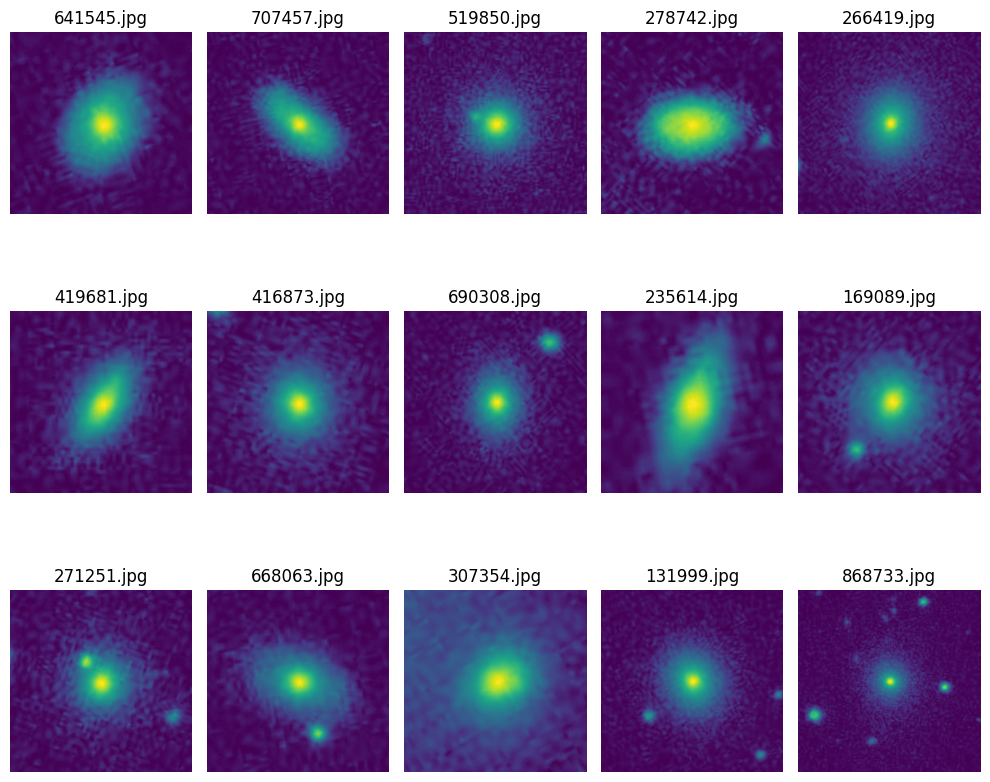

In [18]:
rnd_images = get_random_images(15, ellipticals_dir)
show_images(rnd_images)

### Barred Spirals

Show a few random images from the barred spirals directory.

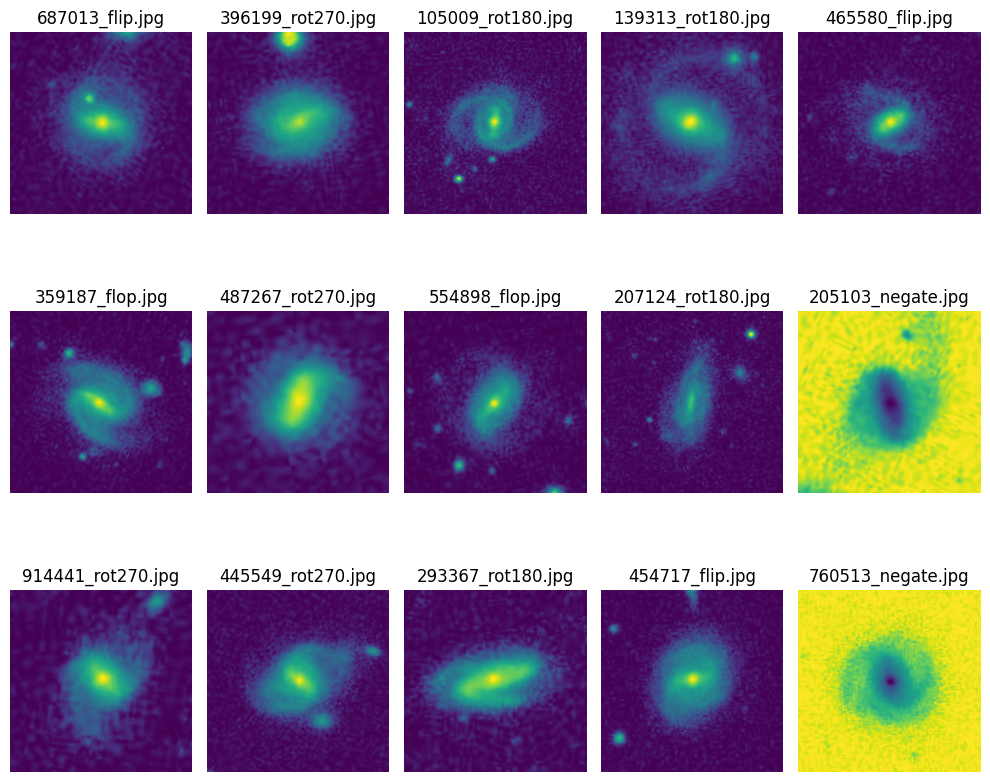

In [20]:
rnd_images = get_random_images(15, barred_spirals_dir)
show_images(rnd_images)

### Common Spirals

Show a few random images from the common spirals directory.

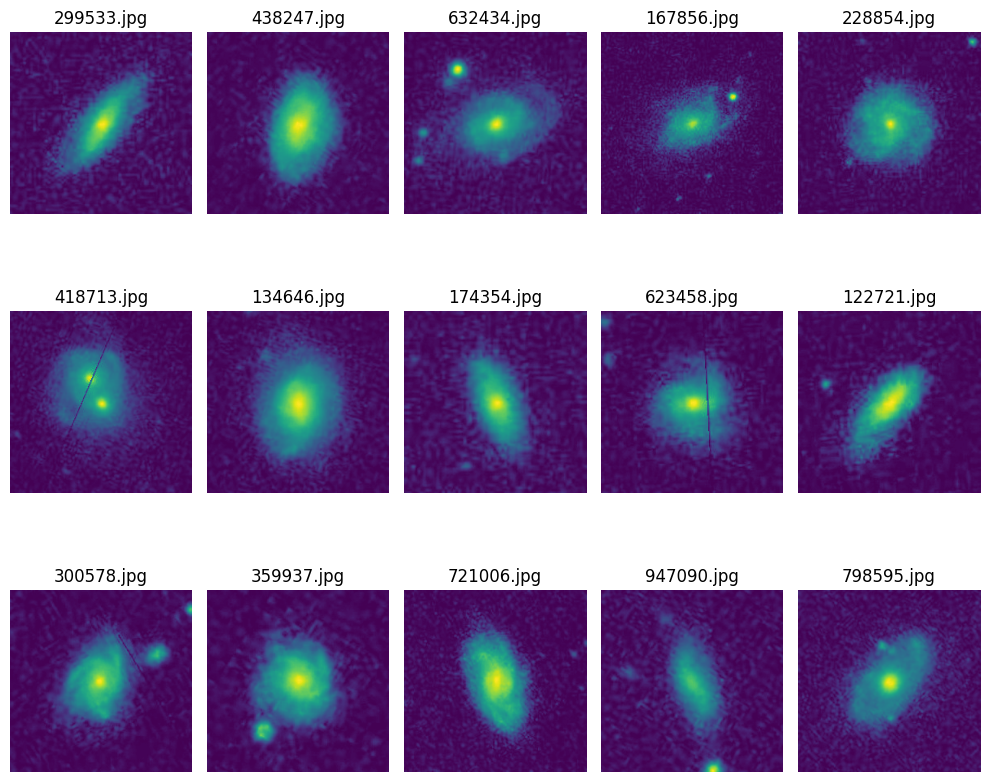

In [21]:
rnd_images = get_random_images(15, common_spirals_dir)
show_images(rnd_images)

## Image processing and augmentations

**Remember!** The folder names created for the different galaxies ***act as the labels*** for the training phase.

<br >

Data augmenttation introduces variations to the training data, enabling the model to learn from diverse perspectives. These transformations help improve the model's ability to generalize to unseen examples and reduce overfitting.

An important augmentation is rescaling the pixel values so they are between 0 and 1 (normalizing) for better performance and convergence.

<br />

---

### Choosing a batch size ###

A larger batch size, such as 100 used here, offers certain advantages. It tends to provide smoother gradient updates since it incorporates a more diverse representation of the dataset during each update step. With a larger batch size, the model can converge faster as it benefits by processing a larger number of samples simultaneously. Additionally, larger batch sizes can take advantage of parallel processing for better training speed.

However, there are potential drawbacks to using larger batch sizes. Primarily this is down to memory and computing resourses needed. Moreover, using larger batch sizes might make the model less prone to generalizing well to unseen data, potentially resulting in overfitting so we tried a few different sizes and settled on 100 as a good choice.

We have subscribed to Colab Pro to gain access to higher memroy and faster compute resource in hopes of mitigating these bottlenecks.

<br >

---

### ImageDataGenerator ###

Read all about it here: [Keras ImageDataGenerator and Data Augmentation](https://pyimagesearch.com/2019/07/08/keras-imagedatagenerator-and-data-augmentation/)

And explore the TensorFlow functions: [TensorFlow Documentation](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator)

In [22]:
# Batch size refers to the number of samples in each training iteration
batch_size = 100

# In this context, the target size is (width, height)
target_size = sample_image.size # Use the actual size
#target_size = (224,224)         # Or manually choose
print(f"Target size is {target_size}\n")

# Set the color_mode parameter to "rgb" or "grayscale"
color_mode = "grayscale"


Target size is (224, 224)



In [23]:
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    #rotation_range=20,
    #width_shift_range=0.2,
    #height_shift_range=0.2,
    #shear_range=0.2,
    #zoom_range=0.2,
    #horizontal_flip=True,
    #fill_mode='nearest',
    validation_split=0.2    # Set validation split size
)

# Flow from the training directory
print("\nTraining split:")
train_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=target_size,
    color_mode=color_mode,
    classes=None,
    class_mode='sparse',
    batch_size=batch_size,
    shuffle=True,
    seed=None,
    save_to_dir=None,
    save_prefix="",
    save_format="png",
    follow_links=False,
    subset='training', # Set this as training data
    interpolation="nearest",)

print("\nValidation split:")
validation_generator = train_datagen.flow_from_directory(
    train_dir, # same directory as training data because using keras to split
    target_size=target_size,
    color_mode=color_mode,
    classes=None,
    class_mode='sparse',
    batch_size=batch_size,
    shuffle=True,
    seed=None,
    save_to_dir=None,
    save_prefix="",
    save_format="png",
    follow_links=False,
    subset='validation', # Set this as validation data
    interpolation="nearest",)

# Sanity check: Split and dataset size equivilant
print(f"\nSplits total and total dataset size: {train_generator.n + validation_generator.n} == {total_items_dataset}")
assert train_generator.n + validation_generator.n == total_items_dataset, \
  f"\nThe splits should be equal to the total dataset size but something went wrong."
clear_session()


Training split:
Found 21198 images belonging to 3 classes.

Validation split:
Found 5298 images belonging to 3 classes.

Splits total and total dataset size: 26496 == 26496


### Fixing Class Imbalance (Optional)

In cases where the dataset categories are unevenly distributed, model training may result in biased performance. To tackle this, the `class_weight` argument in TensorFlow's training function can be used to virtually balance the classes during training.

Add `class_weight=class_weight_dict` in the model fitting to use this feature.

In [24]:
# Try to fix the imbalanced dataset

from sklearn.utils import class_weight

# Get class labels
class_labels = list(train_generator.class_indices.keys())

# Compute class weights
class_weights = class_weight.compute_sample_weight('balanced', train_generator.classes)

# Create a dictionary for class weights
class_weight_dict = dict(enumerate(class_weights))


### Define CNN Model (Version 8)

The Convolutional Neural Network (CNN) in Version 8 is a sequential model designed for image classification tasks. Below is a breakdown of its architecture:

1. **Input Layer**: Accepts images with a shape defined by the `input_shape` argument.

2. **Convolutional Blocks**: The model consists of four convolutional blocks. Each block includes:
    - **Conv2D Layer**: A 2D convolution layer with kernel size (3,3) and padding set to 'same'.
    - **BatchNormalization**: Normalizes the activations.
    - **Activation Function**: Uses ReLU (Rectified Linear Unit) for non-linearity.
    - **MaxPooling2D**: A pooling layer with a 2x2 filter to down-sample the feature maps.
  
3. **Flattening Layer**: After the convolutional blocks, the model has a Flatten layer to reshape the 2D matrices into vectors, which can be fed into Dense layers.

4. **Fully-Connected Blocks**: There are two fully-connected (Dense) layers.
    - The first has 256 nodes, followed by BatchNormalization, ReLU activation, and 20% dropout.
    - The second has 128 nodes, followed by BatchNormalization, ReLU activation, and 20% dropout.

5. **Output Layer**: Consists of a Dense layer with 3 nodes, corresponding to the three categories to be classified, and a Softmax activation function for probabilistic classification.

This architecture offers a balanced blend of feature learning and classification capabilities, enhanced by batch normalization and dropout for regularization.

In [25]:
# Function: Define the CNN model (Version 8)
def get_cnn_model(input_shape):
    """
    This function builds a sequential CNN and returns the model object.
    """
    model = tf.keras.models.Sequential([

    tf.keras.layers.Input(shape=(input_shape)),

    tf.keras.layers.Conv2D(32, (3,3), padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(256, (3,3), padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(256),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(128),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(3),
    tf.keras.layers.Activation('softmax')
])


    return model

## Get the model and check it out

In this code block, we verify that the input shape is suitable and display the model summary to ensure it matches our expectations.

For this project, we are working with images that have been cropped and resized to dimensions of 224x224 pixels.

In [26]:
# Set the color channel based on previous choice
if (color_mode == "grayscale"):
  channel_num = 1
else:
  channel_num = 3

# The input shape is the target_size plus the color channel: 1 or 3
input_shape = target_size + (channel_num,)
print(f"The input shape is {input_shape}\n")

# Sanity check: image size
assert input_shape == (224, 224, 1), \
  f"Expected shape (224, 224, 1) and got {input_shape}"
clear_session()

# Get model
model = get_cnn_model(input_shape)

model.summary()

The input shape is (224, 224, 1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 32)     128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 224, 224, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 batch_normalization_1

In [27]:
# from tensorflow.keras.utils import plot_model
# plot_model(model,
#            to_file='this_model.png',
#            show_shapes=False,
#            show_layer_names=False,
#            show_dtype=False,
#            expand_nested=False)

In [ ]:
# Load the saved weights
# weights_path = os.path.join(Project_Folder, 'model-8_Run-2_BestSoFar_checkpoint.h5')
# model.load_weights(weights_path)

## Look at Activation Map(s)

In the first convolutional layer applied to a galaxy image, multiple versions of the image emerge, each emphasizing different features.

The filters in this layer are designed to detect specific patterns like edges, corners, or textures. As these filters convolve across the image, they generate activation maps (aka feature maps) that highlight regions with these patterns.

By stacking up multiple convolutional layers, the network learns hierarchical representations, capturing more complex features along the way.

<br />

**This image example is 6880.jpg which is classified as a barred-spiral**

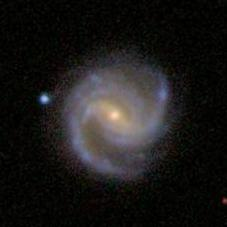


Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 32)     128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 224, 224, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      1849

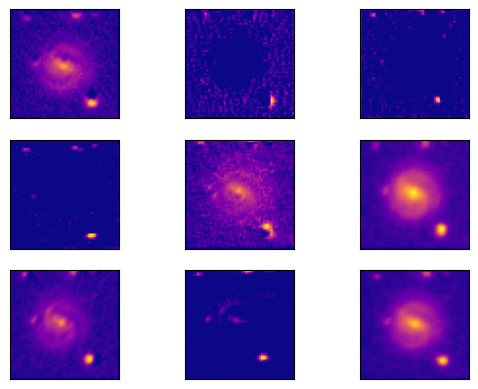

In [34]:
# Visualize the feature maps for one of the images
# credit: https://machinelearningmastery.com/how-to-visualize-filters-and-feature-maps-in-convolutional-neural-networks
#

# redefine model to output right after the first hidden layer
model2 = Model(inputs=model.inputs, outputs=model.layers[10].output)
model2.summary()

if (color_mode == "rgb"):
  # load the image with the required shape for RGB image
  img = load_img(sample_image.filename, target_size=(224, 224))
elif (color_mode == "grayscale"):
  # Load the image with the required shape for B&W image=
  img = Image.open(sample_image.filename).convert('L')

# convert the image to an array
img = img_to_array(img)

# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)

# get feature map for first hidden layer
feature_maps = model2.predict(img)

# plot 8x8 squares
square = 3
ix = 1
for _ in range(square):
  for _ in range(square):
    # specify subplot and turn of axis
    ax = plt.subplot(square, square, ix)
    ax.set_xticks([])
    ax.set_yticks([])

    # plot filter channel in grayscale
    plt.imshow(feature_maps[0, :, :, ix-1], cmap='plasma')
    ix += 1

# show the figure
plt.show()

## Callbacks

**Early stopping:** monitors the performance on the validation data (`val_loss`) during training and stops training early if the performance stops improving. The *patience parameter* refers to the number of epochs that the training process should continue without any improvement in the validation loss before stopping the training process.

**Tensorboard** is a TensorFlow dashboard that is super helpful.

**Save Best** weights which can be loaded later to make predictions without needing to train the model again.

In [35]:
# Early Stopping
early_stop = EarlyStopping(monitor='val_loss',
                           min_delta=0,
                           patience=5,
                           verbose=0,
                           mode='auto',
                           restore_best_weights=True)

# Tensorboard
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Save the weights from best epoch
save_best = tf.keras.callbacks.ModelCheckpoint(
    filepath=os.path.join(Project_Folder, 'model_checkpoint.h5'),
    save_weights_only=True,
    save_best_only=True)

## Compile and Fit model

**Compile** refers to configuring the model for training by specifying the optimizer, loss function, and evaluation metric.

*   Loss function: Use *Sparse Categorical Cross-Entropy* because this is a multi-category problem, this loss fucntion heavily penalizes wrong answers, and it works with softmax activation on the output.
*   Optimizer: Using Adam with a learning rate scheduler.
* Metrics: Using accuracy because it makes sense.
---


**Fit** refers to training the model on the training data by iterating over the data in batches and updating the model parameters based on the gradients computed during training. See [Stochastic Gradient Decent](https://en.wikipedia.org/wiki/Stochastic_gradient_descent).


In [36]:
# Try out a learning rate schedulder for Adam
initial_learning_rate = 0.001

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=100000,
    decay_rate=0.96,
    staircase=True)

optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

# Putting it together
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


# Calculate steps per epoch and validaton steps
# Common formula is train_length // batch_size (Why? See Hands on ML..)
epoch_steps = round(train_generator.n / batch_size)
val_steps   = round(validation_generator.n / batch_size)

# Fitting or learning part
history = model.fit(train_generator,
                    epochs=25,
                    steps_per_epoch=epoch_steps,
                    validation_data=validation_generator,
                    verbose=1,
                    validation_steps=val_steps,
                    callbacks=[early_stop, tensorboard_callback, save_best],
                    class_weight=class_weight_dict
                    )


Epoch 1/25
212/212 [==============================] - 78s 313ms/step - loss: 0.4590 - accuracy: 0.8137 - val_loss: 2.6548 - val_accuracy: 0.4153
Epoch 2/25
212/212 [==============================] - 63s 295ms/step - loss: 0.2804 - accuracy: 0.8921 - val_loss: 0.9604 - val_accuracy: 0.5053
Epoch 3/25
212/212 [==============================] - 59s 277ms/step - loss: 0.2220 - accuracy: 0.9150 - val_loss: 0.4757 - val_accuracy: 0.8260
Epoch 4/25
212/212 [==============================] - 57s 270ms/step - loss: 0.1728 - accuracy: 0.9340 - val_loss: 2.3462 - val_accuracy: 0.4383
Epoch 5/25
212/212 [==============================] - 57s 268ms/step - loss: 0.1477 - accuracy: 0.9449 - val_loss: 0.8521 - val_accuracy: 0.7495
Epoch 6/25
212/212 [==============================] - 57s 267ms/step - loss: 0.1184 - accuracy: 0.9558 - val_loss: 0.4773 - val_accuracy: 0.8426
Epoch 7/25
212/212 [==============================] - 57s 269ms/step - loss: 0.0871 - accuracy: 0.9673 - val_loss: 0.7600 - val_ac

## Analysis

In [37]:
# Stuff to add to the plot titles
current_time = datetime.datetime.now().strftime("%d%b%Y %H:%M")
title_extra = "Model-8 Run-6"

212/212 [==============================] - 25s 114ms/step


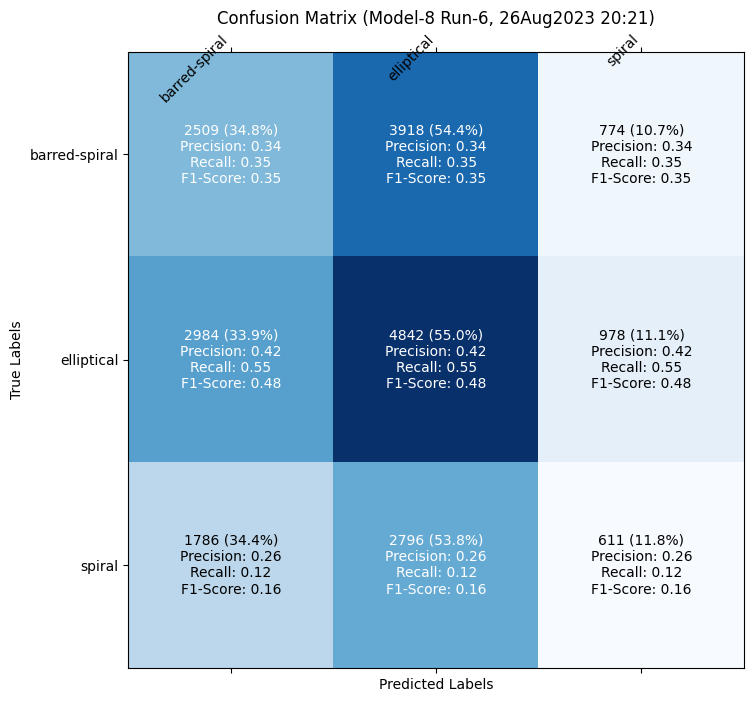

In [38]:
# Make a confusion matrix and display it in Tensorboard

# Make predictions using the model
y_pred_probabilities = model.predict(train_generator)
y_pred_labels = np.argmax(y_pred_probabilities, axis=1)

# Get the array of true labels
y_true = train_generator.classes

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_labels)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]  # normalize to get the percentages

# Scikit learn class report
report = classification_report(y_true, y_pred_labels, output_dict=True)

# Plot the confusion matrix as an image
fig, ax = plt.subplots(figsize=(8, 8))
cax = ax.matshow(cm, cmap='Blues')

# Customize the plot
classes = train_generator.class_indices
class_names = list(classes.keys())
tick_marks = np.arange(len(class_names))
ax.set_xticks(tick_marks)
ax.set_yticks(tick_marks)
ax.set_xticklabels(class_names)
ax.set_yticklabels(class_names)
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')
ax.set_title(f"Confusion Matrix ({title_extra}, {current_time})")

# Adding the text to each cell
thresh = cm.max() / 2.  # this is for the text color
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        precision = report[str(i)]["precision"]
        recall = report[str(i)]["recall"]
        f1_score = report[str(i)]["f1-score"]
        ax.text(j, i, f'{cm[i, j]} ({cm_normalized[i, j]*100:.1f}%)\nPrecision: {precision:.2f}\nRecall: {recall:.2f}\nF1-Score: {f1_score:.2f}',
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

# Rotate the tick labels for better readability
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Save the plot as an image
plt.savefig('confusion_matrix.png')

# Convert the plot to a TensorFlow image tensor
image_tensor = tf.io.read_file('confusion_matrix.png')
image_tensor = tf.image.decode_png(image_tensor, channels=4)
image_tensor = tf.expand_dims(image_tensor, 0)

# Log the confusion matrix image to TensorBoard
with tf.summary.create_file_writer(log_dir).as_default():
    tf.summary.image("Confusion Matrix", image_tensor, step=0)


Best validation accuracy is 84.26%
Best validation loss is 0.4757
---------------------------------



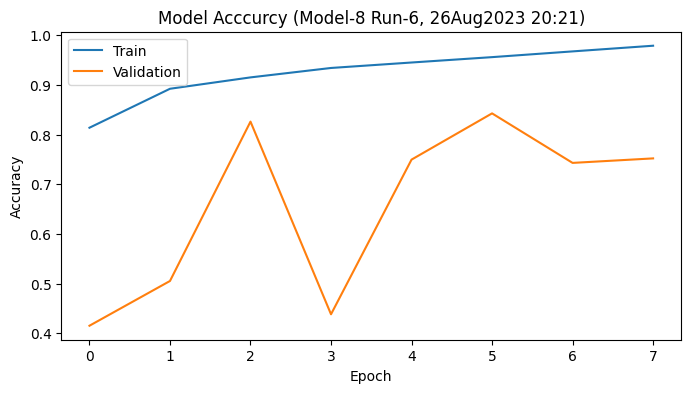

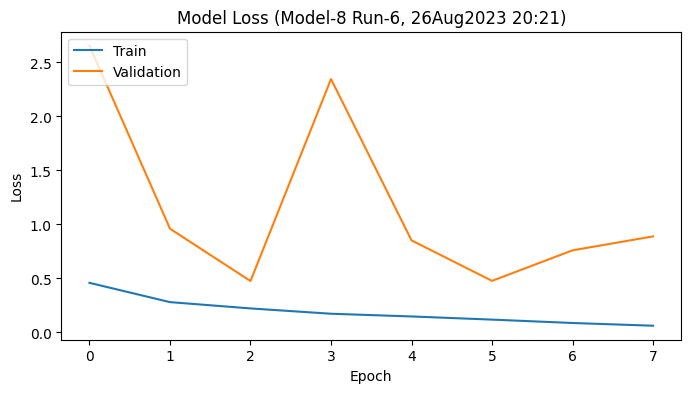

In [39]:
# Get the maximum validation accuracy and minimum validation loss
max_val_acc = np.max(history.history['val_accuracy'])
min_val_loss = np.min(history.history['val_loss'])

print(f"Best validation accuracy is {max_val_acc * 100:.2f}%")
print(f"Best validation loss is {min_val_loss:.4f}")
print("---------------------------------\n")

# Plot training & validation accuracy values
plt.figure(figsize=(8, 4))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title(f"Model Acccurcy ({title_extra}, {current_time})")
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(8, 4))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title(f"Model Loss ({title_extra}, {current_time})")
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [40]:
# Call the TensorFlow dashboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

## Test

Upload samples and let the model make predictions.

1/1 [==============================] - 0s 23ms/step


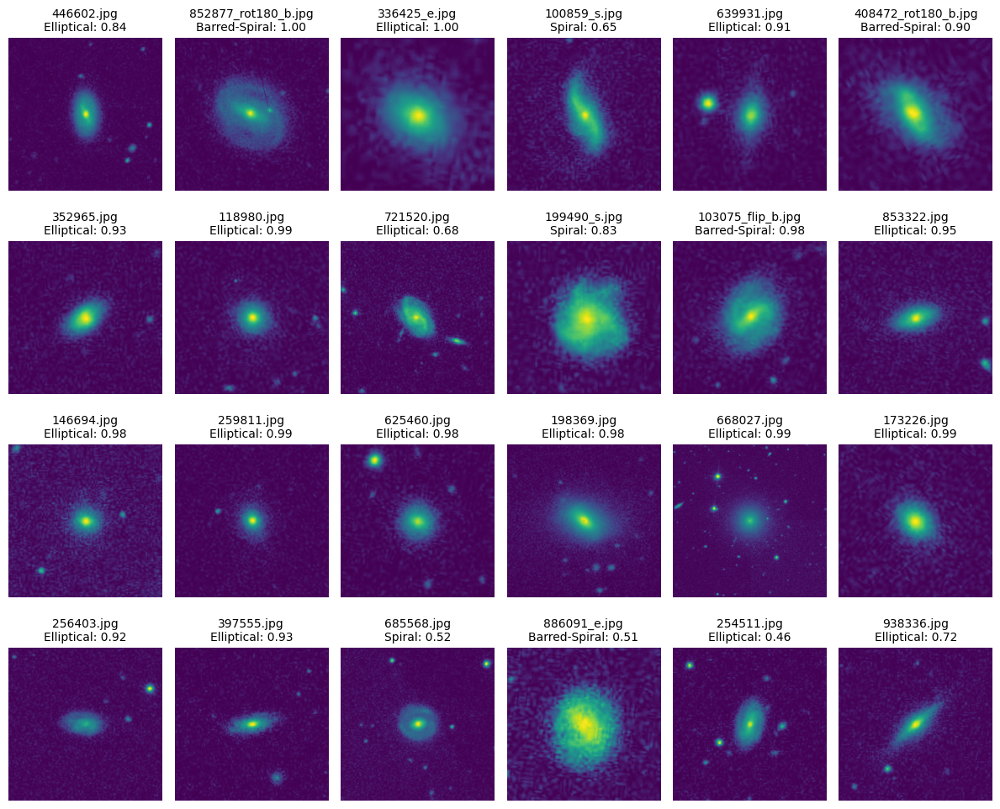

In [41]:
# Define labels
# Double check the order is correct and if see the
# predictions are way off then check this first.
labels = {0:'Barred-Spiral', 1:'Elliptical', 2:'Spiral'}

# Set the target size
target_size = target_size

# Define where the images are
image_dir = '/content/dataset/gz-test-images_1'

# Get list of image files
all_files = os.listdir(image_dir)
image_files = [fn for fn in all_files if fn.lower().endswith('.jpg')]

# Load model if it's from a saved model
# model = tf.saved_model.load(savedModelPath)

# Number of images
n = len(image_files)

# If the number of images is not exactly 24, this code might fail
# So it's better to assert this condition.
# Todo: fix this requirement
assert n == 24, f"Expected 24 images, but got {n} images."

# Create a subplot
fig, axs = plt.subplots(4, 6, figsize=(12, 10))

# Flatten the axis array, to make indexing easier
axs = axs.flatten()

# Loop through the images, make predeictions, and add to the plot
for idx, fn in enumerate(image_files):
    # Predicting images
    path = os.path.join(image_dir, fn)
    img = image.load_img(path, target_size=target_size, color_mode='grayscale')
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)

    # Apply any required preprocessing
    x = x / 255.0

    classes = model.predict(x, batch_size=3)
    index_max = np.argmax(classes)

    axs[idx].imshow(img)
    axs[idx].axis('Off')
    axs[idx].set_title(f'{fn}\n{labels[index_max]}: {classes[0][index_max]:.2f}', fontsize=10)

plt.tight_layout()
plt.show()